In [1]:
import numpy as np
import os, sys, librosa
from librosa import display
from scipy import signal
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec
import IPython.display as ipd
import pandas as pd
from numba import jit
from IPython.display import Audio 
import IPython

import cdpam

from scipy.stats import pearsonr, spearmanr

import scipy.spatial as sp

import torch
import torch.nn as nn
import torch.fft
from torch.autograd import Variable
import torch.optim as optim
import numpy as np

import noisereduce as nr

import librosa
from IPython.display import Audio, display
from PIL import Image
import matplotlib.pyplot as plt
import scipy.stats as stats
import collections as c

from tifresi.utils import load_signal
from tifresi.utils import preprocess_signal
from tifresi.stft import GaussTF, GaussTruncTF
from tifresi.transforms import log_spectrogram
from tifresi.transforms import inv_log_spectrogram

from torch.nn.modules.module import _addindent

import copy
import os
import math

import soundfile as sf
from matplotlib.pyplot import figure
import pickle

from sklearn.preprocessing import MinMaxScaler
import glob

import sys
sys.path.insert(0, '../')
import dnnlib
from utils import util, training_utils, losses, masking, gmloss
from networks import stylegan_encoder

%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


from scipy.signal import freqz,butter, lfilter

%load_ext autoreload
%autoreload 2

In [2]:
network_pkl = '/home/purnima/appdir/Github/StyleGANs/audio-stylegan2/training-runs/vis-data-256-split/00000/network-snapshot-002800.pkl'

sample_rate = 16000
stft_channels = 512 #510
n_frames = 256
hop_size = 128
sample_rate = 16000
        
device = torch.device('cuda')
with open(network_pkl, 'rb') as pklfile:
    network = pickle.load(pklfile)
    G = network['G'].to(device).eval()


    
    
# encoder_pt = '../checkpoints/sgan_encoder_greatesthits_resnet-34_RGBM-corrected/netE_epoch_best.pth'
encoder_pt = '../checkpoints/sgan_encoder_greatesthits_resnet-34_RGBM-corrected-nolpips/netE_epoch_best.pth'
netE = stylegan_encoder.load_stylegan_encoder(domain=None, nz=G.z_dim,
                                                   outdim=128,
                                                   use_RGBM=True,#opt.masked,
                                                   use_VAE=False,#opt.vae_like,
                                                   resnet_depth=34,
                                                   ckpt_path=encoder_pt)
netE = netE.to(device).eval()


Using halfsize?: False
Input channels: 2


In [3]:
def applyFBFadeFilter(forward_fadetime,backward_fadetime,signal,fs,expo=1):
    forward_num_fad_samp = int(forward_fadetime*fs) 
    backward_num_fad_samp = int(backward_fadetime*fs) 
    signal_length = len(signal) 
    fadefilter = np.ones(signal_length)
    if forward_num_fad_samp>0:
        fadefilter[0:forward_num_fad_samp]=np.linspace(0,1,forward_num_fad_samp)**expo
    if backward_num_fad_samp>0:
        fadefilter[signal_length-backward_num_fad_samp:signal_length]=np.linspace(1,0,backward_num_fad_samp)**expo
    return fadefilter*signal

def pghi_stft(x):
    use_truncated_window = True
    if use_truncated_window:
        stft_system = GaussTruncTF(hop_size=hop_size, stft_channels=stft_channels)
    else:
        stft_system = GaussTF(hop_size=hop_size, stft_channels=stft_channels)
    Y = stft_system.spectrogram(x)
    log_Y= log_spectrogram(Y)
    return np.expand_dims(log_Y,axis=0)

def zeropad(signal, audio_length):
    if len(signal) < audio_length:
        return np.append(
            signal, 
            np.zeros(audio_length - len(signal))
        )
    else:
        signal = signal[0:audio_length]
        return signal

def pghi_istft(x):
    use_truncated_window = True
    if use_truncated_window:
        stft_system = GaussTruncTF(hop_size=hop_size, stft_channels=stft_channels)
    else:
        stft_system = GaussTF(hop_size=hop_size, stft_channels=stft_channels)

    x = np.squeeze(x,axis=0)
    new_Y = inv_log_spectrogram(x)
    new_y = stft_system.invert_spectrogram(new_Y)
    return new_y

def renormalize(n, range1, range2):
    delta1 = range1[1] - range1[0]
    delta2 = range2[1] - range2[0]
    return (delta2 * (n - range1[0]) / delta1) + range2[0]

def read_and_plot(f, title=None):
    y, sr = librosa.load(f, sr=sample_rate)
    plot(y, title)

def plot(y, title=None):
    IPython.display.display(IPython.display.Audio(y, rate=sample_rate))
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
    
    y_pghi = y
    y_pghi = preprocess_signal(y_pghi)
    y_pghi = zeropad(y_pghi, n_frames * hop_size )
    y_pghi = pghi_stft(y_pghi)
    
    a=librosa.display.specshow(y_pghi[0],x_axis='time', y_axis='linear', ax=ax[0], sr=sample_rate, hop_length=hop_size)
    ax[0].set_title(title)
    
    ax[1].plot(y)
    
def plot_multi(y1, y2, title1=None, title2=None):
    IPython.display.display(IPython.display.Audio(y1, rate=sample_rate))
    IPython.display.display(IPython.display.Audio(y2, rate=sample_rate))
    
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
    
    y_pghi = y1
    y_pghi = preprocess_signal(y_pghi)
    y_pghi = zeropad(y_pghi, n_frames * hop_size )
    y_pghi = pghi_stft(y_pghi)
    
    a=librosa.display.specshow(y_pghi[0],x_axis='time', y_axis='linear', ax=ax[0], sr=sample_rate, hop_length=hop_size)
    ax[0].set_title(title1)
    
    y_pghi = y2
    y_pghi = preprocess_signal(y_pghi)
    y_pghi = zeropad(y_pghi, n_frames * hop_size )
    y_pghi = pghi_stft(y_pghi)
    
    a=librosa.display.specshow(y_pghi[0],x_axis='time', y_axis='linear', ax=ax[1], sr=sample_rate, hop_length=hop_size)
    ax[1].set_title(title2)
    


In [4]:
def butter_bandpass(lowcut, highcut, fs, order=5,btype='bandpass'):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype=btype)
    return b, a

def butter_lowhighpass(cut, fs, order=5, btype='lowpass'):
    nyq = 0.5 * fs
    cut = cut / nyq
    b, a = butter(order, cut, btype=btype)
    return b, a

def butter_bandpass_filter(data, highcut, fs,lowcut=None,  order=5, btype='bandpass'):
    if btype=='bandpass':
        b, a = butter_bandpass(lowcut, highcut, fs, order=order, btype=btype)
    else:
        b, a = butter_lowhighpass(highcut, fs, order=order, btype=btype)
    y = lfilter(b, a, data)
    return y

def gaver_impact_solidbar_single(initial_amplitude, impulse_time, num_partials, size='small', metal_or_plastic='metal', samplerate=16000):
    t_ = np.linspace(0,impulse_time,int(impulse_time*samplerate))
    
    omega_1 = 240 #In Hz. Frequency is inversely proportional to size
    if size == 'small':
        omega_1 = 660
        
    D = 0.001
    if metal_or_plastic == 'plastic':
        D = 0.5
    
    h=[h_ for h_ in np.arange(-0.005, 0.005, (0.005+0.005)/num_partials)][::-1]
    
    gn=np.zeros(int(impulse_time*samplerate))
    for i in range(num_partials):
        omega_n_radians = omega_1*((2*i + 1)**2)/9
        
        phi = initial_amplitude + h[i]*(omega_n_radians - (2*np.pi*omega_1))
        
        delta_n = omega_n_radians * D
        g = phi * np.exp(-1*delta_n*t_) * np.cos(omega_n_radians * t_)
        gn = gn + g
    return gn


def gaver_impact_plate_single(initial_amplitude, impulse_time, num_partials, size='small', metal_or_plastic='metal', samplerate=16000):
    t_ = np.linspace(0,impulse_time,int(impulse_time*samplerate))
    
    omega_1 = 60 #In Hz. Frequency is inversely proportional to size
    if size == 'small':
        omega_1 = 250
        
    D = 0.001
    if metal_or_plastic == 'plastic':
        D = 0.3
    
    h=[h_ for h_ in np.arange(-0.005, 0.005, (0.005+0.005)/num_partials)][::-1]
    
    gn=np.zeros(int(impulse_time*samplerate))
    for i in range(num_partials):
        omega_n = omega_1 + i*omega_1 + np.random.randint(50)
        omega_n_radians = 2 * np.pi * omega_n
        
        phi = initial_amplitude + h[i]*(omega_n_radians - (2*np.pi*omega_1))
        
        delta_n = omega_n_radians * D
        g = phi * np.exp(-1*delta_n*t_) * np.cos(omega_n_radians * t_)
        gn = gn + g
    return gn
    
def gaver_impact_plate(initial_amplitude, impulse_time, num_partials, size='small', metal_or_plastic='metal', samplerate=16000, total_time=0, locs=None):
    single_hit = gaver_impact_plate_single(initial_amplitude, impulse_time, num_partials, size, metal_or_plastic, samplerate)
    gn=np.zeros(int(total_time*samplerate))
    for loc in locs:
        start_loc = int(loc*sample_rate)
        end_loc = start_loc+len(single_hit)
        single_hit_ = single_hit

        if end_loc > len(gn):
            end_loc = len(gn)
            single_hit_ = single_hit_[0:end_loc-start_loc]

        gn[start_loc:end_loc] = applyFBFadeFilter(forward_fadetime=0.2,backward_fadetime=0,signal=single_hit_,fs=sample_rate)

    return gn/np.max(gn)

def gaver_impact_solidbar(initial_amplitude, impulse_time, num_partials, size='small', metal_or_plastic='metal', samplerate=16000, total_time=0, locs=None):
    single_hit = gaver_impact_solidbar_single(initial_amplitude, impulse_time, num_partials, size, metal_or_plastic, samplerate)
    gn=np.zeros(int(total_time*samplerate))
    for loc in locs:
        start_loc = int(loc*sample_rate)
        end_loc = start_loc+len(single_hit)
        single_hit_ = single_hit

        if end_loc > len(gn):
            end_loc = len(gn)
            single_hit_ = single_hit_[0:end_loc-start_loc]

        gn[start_loc:end_loc] = applyFBFadeFilter(forward_fadetime=0.05,backward_fadetime=0,signal=single_hit_,fs=sample_rate)

    return gn/np.max(gn)

In [5]:
def encode_and_reconstruct(audio):
    audio_pghi = preprocess_signal(audio)
    audio_pghi = zeropad(audio_pghi, n_frames * hop_size )
    audio_pghi = pghi_stft(audio_pghi)
    audio_pghi = renormalize(audio_pghi, (np.min(audio_pghi), np.max(audio_pghi)), (im_min, im_max))

    audio_pghi = torch.from_numpy(audio_pghi).float().cuda().unsqueeze(dim=0)
    mask = torch.ones_like(audio_pghi)[:, :1, :, :]
    net_input = torch.cat([audio_pghi, mask], dim=1).cuda()
    with torch.no_grad():
        encoded = netE(net_input)

    reconstructed_audio = G.synthesis(torch.stack([encoded] * 14, dim=1))
    filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
    reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
    reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
    reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
    reconstructed_audio_wav = pghi_istft(reconstructed_audio)
    
    return encoded, reconstructed_audio_wav

def get_spectrogram(audio):
    audio_pghi = preprocess_signal(audio)
    audio_pghi = zeropad(audio_pghi, n_frames * hop_size )
    audio_pghi = pghi_stft(audio_pghi)
    return audio_pghi


In [6]:

#filters = [(low1, high1), (low2, high2)]
def get_gaver_scratches(initial_amplitude, impulse_time, filters, total_time=2, locs=None, sample_rate=16000, hittype='hit'):
    y_scratch = np.random.rand(int(impulse_time*sample_rate))
    
    #20%
    start_t = 0.0
    end_t = 0.05*impulse_time
    fade_expo = 1
    y1 = initial_amplitude*y_scratch[int(start_t*sample_rate):int(end_t*sample_rate)]
    y1 = 20*butter_bandpass_filter(y1, lowcut=filters[0][0], highcut=filters[0][1], fs=sample_rate, order=2, btype='bandpass')
    y1 = applyFBFadeFilter(0,0.1*(end_t-start_t),y1,sample_rate, expo=fade_expo)
    y1 = np.pad(y1, (int(start_t*sample_rate),len(y_scratch)-int(end_t*sample_rate)), mode='constant')
    
    #Remaining 80%
    start_t = 0.05*impulse_time
    end_t = 1.0*impulse_time
    fade_expo = 1
    y2 = initial_amplitude*y_scratch[int(start_t*sample_rate):int(end_t*sample_rate)]
    y2 = 10*butter_bandpass_filter(y2, lowcut=filters[1][0], highcut=filters[1][1], fs=sample_rate, order=2, btype='bandpass')
    y2 = applyFBFadeFilter(0,0.1*(end_t-start_t),y2,sample_rate, expo=fade_expo)
    y2 = np.pad(y2, (int(start_t*sample_rate),len(y_scratch)-int(end_t*sample_rate)), mode='constant')
    
    
    y_scratch = y1+y2
    
    signal_mult = 0.00005
    if hittype == 'scratch':
        signal_mult = 0.0005
    signal = signal_mult*np.random.randn(int(total_time*sample_rate))
    
    for loc in locs:
        start_loc = int(loc*sample_rate)
        end_loc = start_loc+len(y_scratch)
        y_scratch_ = y_scratch

        if end_loc > len(signal):
            end_loc = len(signal)
            y_scratch_ = y_scratch_[0:end_loc-start_loc]

        signal[start_loc:end_loc] = y_scratch_
    return signal/np.max(signal)

In [7]:
z = torch.from_numpy(np.random.randn(1, G.z_dim)).to(device)
im = G(z, None)
im_min = torch.min(im).cpu().numpy()
im_max = torch.max(im).cpu().numpy()
print(im_min, im_max)

pghi_min = -50.0
pghi_max = 0.0

np.random.seed(123)

num_samples = 2 # Number of Gaver samples created 

rate_locs_0_per_sec = [0.05]
rate_locs_1_per_sec = [0.05, 1.05]
rate_locs_2_per_sec = [0.05, 0.9, 1.75]
rate_locs_2irreg_per_sec = [0.05, 1.25, 1.75]
rate_locs_3_per_sec = [0.05, 0.45, 0.85, 1.25, 1.65]
rate_locs_4_per_sec = [0.05, 0.35, 0.65, 0.95, 1.25, 1.55, 1.85]

locs = [rate_locs_0_per_sec, rate_locs_1_per_sec, rate_locs_2_per_sec, rate_locs_3_per_sec, rate_locs_4_per_sec]

Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.
-1.0492142 1.0700175


In [8]:
gaver_config = {}
gaver_config['hit_tinny_sample0_rate0'] = {'impulse_time': 0.4, 'attack_lf': 2000, 'attack_hf': 7500, 'trail_lf': 5000, 'trail_hf': 7500 }
gaver_config['hit_tinny_sample0_rate1'] = {'impulse_time': 0.2, 'attack_lf': 2000, 'attack_hf': 7500, 'trail_lf': 7000, 'trail_hf': 7500 }
gaver_config['hit_tinny_sample0_rate2'] = {'impulse_time': 0.2 , 'attack_lf': 2000, 'attack_hf': 7500, 'trail_lf': 7000, 'trail_hf': 7500 }
gaver_config['hit_tinny_sample0_rate3'] = {'impulse_time': 0.1, 'attack_lf': 2000, 'attack_hf': 7500, 'trail_lf': 2000, 'trail_hf': 7500}
gaver_config['hit_tinny_sample0_rate4'] = {'impulse_time': 0.05, 'attack_lf': 500, 'attack_hf': 7500, 'trail_lf': 5000, 'trail_hf': 7500}

gaver_config['hit_tinny_sample1_rate0'] = {'impulse_time': 0.5, 'attack_lf': 200, 'attack_hf': 7500, 'trail_lf': 200, 'trail_hf': 7500  }
gaver_config['hit_tinny_sample1_rate1'] = {'impulse_time': 0.3, 'attack_lf': 200, 'attack_hf': 7500, 'trail_lf': 200, 'trail_hf': 7500  }
gaver_config['hit_tinny_sample1_rate2'] = {'impulse_time': 0.3, 'attack_lf': 200, 'attack_hf': 7500, 'trail_lf': 200, 'trail_hf': 7500 }
gaver_config['hit_tinny_sample1_rate3'] = {'impulse_time': 0.1, 'attack_lf': 10, 'attack_hf': 7500, 'trail_lf': 7000, 'trail_hf': 7500 }
gaver_config['hit_tinny_sample1_rate4'] = {'impulse_time': 0.1, 'attack_lf': 500, 'attack_hf': 7500, 'trail_lf': 5000, 'trail_hf': 7500}


gaver_config['hit_tinny_sample1_rateirreg2'] = {'impulse_time': 0.3, 'attack_lf': 200, 'attack_hf': 7500, 'trail_lf': 200, 'trail_hf': 7500 }


gaver_config['hit_muffled_sample0_rate0'] = {'impulse_time': 0.2, 'attack_lf': 200, 'attack_hf': 500, 'trail_lf': 200, 'trail_hf': 500 }
gaver_config['hit_muffled_sample0_rate1'] = {'impulse_time': 0.2, 'attack_lf': 200, 'attack_hf': 500, 'trail_lf': 200, 'trail_hf': 500 }
gaver_config['hit_muffled_sample0_rate2'] = {'impulse_time': 0.2, 'attack_lf': 200, 'attack_hf': 500, 'trail_lf': 200, 'trail_hf': 500 }
gaver_config['hit_muffled_sample0_rate3'] = {'impulse_time': 0.2, 'attack_lf': 200, 'attack_hf': 500, 'trail_lf': 200, 'trail_hf': 500 }
gaver_config['hit_muffled_sample0_rate4'] = {'impulse_time': 0.035, 'attack_lf': 20, 'attack_hf': 1200, 'trail_lf': 1000, 'trail_hf': 2200 }

gaver_config['hit_muffled_sample1_rate0'] = {'impulse_time': 0.3, 'attack_lf': 10, 'attack_hf': 1500, 'trail_lf': 10, 'trail_hf': 1500 }
gaver_config['hit_muffled_sample1_rate1'] = {'impulse_time': 0.3, 'attack_lf': 10, 'attack_hf': 1500, 'trail_lf': 10, 'trail_hf': 1500 }
gaver_config['hit_muffled_sample1_rate2'] = {'impulse_time': 0.3, 'attack_lf': 10, 'attack_hf': 1500, 'trail_lf': 10, 'trail_hf': 1500 }
gaver_config['hit_muffled_sample1_rate3'] = {'impulse_time': 0.05, 'attack_lf': 10, 'attack_hf': 1500, 'trail_lf': 10, 'trail_hf': 1500 }
gaver_config['hit_muffled_sample1_rate4'] =  {'impulse_time': 0.05, 'attack_lf': 1000, 'attack_hf': 4000, 'trail_lf': 1000, 'trail_hf': 4000 }




gaver_config['scratch_tinny_sample0_rate0'] = {'impulse_time': 0.9 , 'attack_lf': 400, 'attack_hf': 7900, 'trail_lf': 6500, 'trail_hf': 7900 }
gaver_config['scratch_tinny_sample0_rate1'] = {'impulse_time': 0.9 , 'attack_lf': 400, 'attack_hf': 7900, 'trail_lf': 6500, 'trail_hf': 7900 }
gaver_config['scratch_tinny_sample0_rate2'] = {'impulse_time': 0.8 , 'attack_lf': 400, 'attack_hf': 7900, 'trail_lf': 6500, 'trail_hf': 7900 }
gaver_config['scratch_tinny_sample0_rate3'] = {'impulse_time': 0.3 , 'attack_lf': 400, 'attack_hf': 7900, 'trail_lf': 6000, 'trail_hf': 7900 }
gaver_config['scratch_tinny_sample0_rate4'] = {'impulse_time': 0.2 , 'attack_lf': 400, 'attack_hf': 7900, 'trail_lf': 5000, 'trail_hf': 7900 }

gaver_config['scratch_tinny_sample1_rate0'] = {'impulse_time': 0.9, 'attack_lf': 6900, 'attack_hf': 7900, 'trail_lf': 6900, 'trail_hf': 7900 }
gaver_config['scratch_tinny_sample1_rate1'] = {'impulse_time': 0.9, 'attack_lf': 6900, 'attack_hf': 7900, 'trail_lf': 6900, 'trail_hf': 7900 }
gaver_config['scratch_tinny_sample1_rate2'] = {'impulse_time': 0.8, 'attack_lf': 6900, 'attack_hf': 7900, 'trail_lf': 6900, 'trail_hf': 7900 }
gaver_config['scratch_tinny_sample1_rate3'] = {'impulse_time': 0.25, 'attack_lf': 6900, 'attack_hf': 7900, 'trail_lf': 6900, 'trail_hf': 7900 }
gaver_config['scratch_tinny_sample1_rate4'] = {'impulse_time': 0.17, 'attack_lf': 1500, 'attack_hf': 7900, 'trail_lf': 1500, 'trail_hf': 7900 }



gaver_config['scratch_muffled_sample0_rate0'] = {'impulse_time': 0.3, 'attack_lf': 10, 'attack_hf': 70, 'trail_lf': 100, 'trail_hf': 2000 }
gaver_config['scratch_muffled_sample0_rate1'] = {'impulse_time': 0.7, 'attack_lf': 10, 'attack_hf': 70, 'trail_lf': 100, 'trail_hf': 2000 }
gaver_config['scratch_muffled_sample0_rate2'] = {'impulse_time': 0.6, 'attack_lf': 10, 'attack_hf': 70, 'trail_lf': 100, 'trail_hf': 2000 }
gaver_config['scratch_muffled_sample0_rate3'] = {'impulse_time': 0.25, 'attack_lf': 100, 'attack_hf': 1000, 'trail_lf': 100, 'trail_hf': 1000 }
gaver_config['scratch_muffled_sample0_rate4'] = {'impulse_time': 0.15, 'attack_lf': 100, 'attack_hf': 1000, 'trail_lf': 100, 'trail_hf': 1000 }

gaver_config['scratch_muffled_sample1_rate0'] = {'impulse_time': 0.7, 'attack_lf': 100, 'attack_hf': 150, 'trail_lf': 100, 'trail_hf': 350 }
gaver_config['scratch_muffled_sample1_rate1'] = {'impulse_time': 0.75, 'attack_lf': 20, 'attack_hf': 150, 'trail_lf': 20, 'trail_hf': 1800 }
gaver_config['scratch_muffled_sample1_rate2'] = {'impulse_time': 0.65, 'attack_lf': 20, 'attack_hf': 150, 'trail_lf': 20, 'trail_hf': 1800 }
gaver_config['scratch_muffled_sample1_rate3'] = {'impulse_time': 0.3, 'attack_lf': 20, 'attack_hf': 150, 'trail_lf': 20, 'trail_hf': 1800 }
gaver_config['scratch_muffled_sample1_rate4'] = {'impulse_time': 0.17, 'attack_lf': 700, 'attack_hf': 1700, 'trail_lf': 700, 'trail_hf': 1700 }


# Gaver Samples

In [9]:
#hit_tinny_partial0_rate0

list_of_materials = ['tinny', 'muffled']

file_dict = {}

for key in gaver_config.keys():
    
    rate_str = int(key.split('_')[-1][-1])
    rate = rate_locs_0_per_sec
    if rate_str == 1:
        rate = rate_locs_1_per_sec
    if rate_str == 2:
        if 'irreg' in key:
            rate = rate_locs_2irreg_per_sec
        else:
            rate = rate_locs_2_per_sec
    if rate_str == 3:
        rate = rate_locs_3_per_sec
    if rate_str == 4:
        rate = rate_locs_4_per_sec
        
    
    config = gaver_config[key]

    gaver_audio = get_gaver_scratches(initial_amplitude=1, impulse_time=config['impulse_time'], \
                                      filters= [(config['attack_lf'], config['attack_hf']), (config['trail_lf'], config['trail_hf'])], total_time=2, \
                                            locs=rate, sample_rate=sample_rate, hittype='hit')

    encoded, reconstructed_audio = encode_and_reconstruct(gaver_audio)
    file_dict[key] = {'audio':gaver_audio, 'encoded': encoded, 'reconstructed_audio':reconstructed_audio}


all_samples_dict = file_dict
print(len(all_samples_dict)) #Format: hit_tinny_sample7_rate0
all_samples_dict.keys()

41


dict_keys(['hit_tinny_sample0_rate0', 'hit_tinny_sample0_rate1', 'hit_tinny_sample0_rate2', 'hit_tinny_sample0_rate3', 'hit_tinny_sample0_rate4', 'hit_tinny_sample1_rate0', 'hit_tinny_sample1_rate1', 'hit_tinny_sample1_rate2', 'hit_tinny_sample1_rate3', 'hit_tinny_sample1_rate4', 'hit_tinny_sample1_rateirreg2', 'hit_muffled_sample0_rate0', 'hit_muffled_sample0_rate1', 'hit_muffled_sample0_rate2', 'hit_muffled_sample0_rate3', 'hit_muffled_sample0_rate4', 'hit_muffled_sample1_rate0', 'hit_muffled_sample1_rate1', 'hit_muffled_sample1_rate2', 'hit_muffled_sample1_rate3', 'hit_muffled_sample1_rate4', 'scratch_tinny_sample0_rate0', 'scratch_tinny_sample0_rate1', 'scratch_tinny_sample0_rate2', 'scratch_tinny_sample0_rate3', 'scratch_tinny_sample0_rate4', 'scratch_tinny_sample1_rate0', 'scratch_tinny_sample1_rate1', 'scratch_tinny_sample1_rate2', 'scratch_tinny_sample1_rate3', 'scratch_tinny_sample1_rate4', 'scratch_muffled_sample0_rate0', 'scratch_muffled_sample0_rate1', 'scratch_muffled_samp

# Real Data

In [10]:
hit_scratches_data_dir = '/home/purnima/appdir/Github/DATA/GreatestHitsDB/seeds/hits_and_scratches_samples'

list_of_materials = ['metal','ceramic','tile','glass','wood','rock','plastic','cloth','paper','carpet','dirt','leaf','water']
#Materials go from tinnier to muffled

realdata_file_dict = {}

# <material>_<hit_type>_<sample_id>_rate<rate=(0,1,2,3)>.wav --> Use only 0,1,2
for filename in os.listdir(hit_scratches_data_dir):
    
    audio, _ = librosa.load(os.path.join(hit_scratches_data_dir, filename), sr=sample_rate)
    encoded, reconstructed = encode_and_reconstruct(audio)
        
    realdata_file_dict[filename.split('.')[0]]=encoded
print(len(realdata_file_dict))

520


In [11]:
realdata_file_dict.keys()

dict_keys(['rock_scratch_2_rate3', 'plastic_hit_1_rate0', 'ceramic_scratch_1_rate0', 'wood_scratch_1_rate2', 'tile_scratch_1_rate2', 'carpet_hit_3_rate1', 'glass_hit_2_rate0', 'plastic_scratch_4_rate1', 'rock_hit_3_rate1', 'wood_scratch_3_rate0', 'cloth_scratch_3_rate2', 'carpet_scratch_3_rate0', 'ceramic_scratch_3_rate2', 'ceramic_scratch_5_rate2', 'cloth_hit_5_rate3', 'rock_scratch_4_rate1', 'water_hit_4_rate3', 'paper_hit_3_rate0', 'glass_scratch_2_rate0', 'dirt_hit_4_rate2', 'rock_scratch_3_rate0', 'tile_scratch_3_rate1', 'plastic_scratch_3_rate0', 'tile_scratch_5_rate1', 'wood_hit_2_rate1', 'cloth_scratch_5_rate3', 'plastic_hit_4_rate3', 'metal_hit_3_rate3', 'carpet_scratch_3_rate3', 'leaf_scratch_1_rate3', 'tile_hit_3_rate2', 'metal_scratch_3_rate0', 'ceramic_scratch_4_rate1', 'carpet_hit_5_rate0', 'paper_hit_5_rate0', 'leaf_hit_2_rate3', 'leaf_scratch_3_rate3', 'glass_hit_5_rate2', 'dirt_hit_1_rate3', 'tile_scratch_5_rate3', 'water_scratch_2_rate1', 'paper_hit_1_rate2', 'paper_s

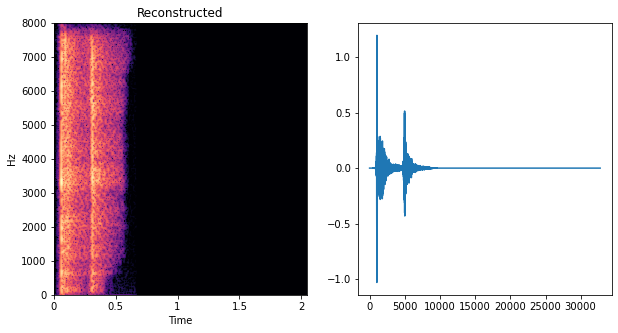

In [14]:
out_of_distribution_point = np.array([ 2.2171,  4.9921,  0.7814,  1.3187, -2.0802,  1.1706,  0.6025,  3.3752,
          4.1723, -1.4003,  1.1834,  4.5802,  0.9303, -2.5037,  5.0145,  1.7405,
         -0.3897, -0.8819,  2.9573, -2.7520, -0.4598,  1.2715,  2.1255, -0.5766,
         -5.1234, -4.8415, -0.4967,  0.1870, -2.2215,  1.1497,  6.3255,  2.0851,
          1.1687,  3.3769,  0.9735, -2.5478,  5.1566, -0.7254, -2.6575,  0.8130,
          6.9946,  1.1228, -2.8462,  0.9700,  0.4232,  0.0997, -1.2069,  2.8858,
         -3.2312,  4.4151,  0.9282, -2.9372,  3.3324, -0.1809, -2.6240, -1.2333,
          0.5119,  4.7165, -2.0592,  0.1811,  1.7660, -2.7390,  1.9286,  2.0189,
         -1.7104,  1.0777, -3.0439,  1.5562,  2.3425, -0.2610, -0.4598,  0.0859,
         -1.3313, -0.9163, -1.1742,  1.6184, -1.6094, -0.2989,  0.0205,  0.3376,
          2.4536,  0.3791,  0.5997,  3.5949,  0.7765,  2.7938,  2.8962,  0.5325,
          0.1124, -1.3006, -2.0969,  0.7780, -4.3320,  0.8391, -2.1940, -0.2843,
          3.4250,  1.9262,  0.2690, -0.1203,  1.0563,  2.4096, -0.5678, -0.4244,
         -0.5194,  2.5114,  1.1430, -1.0062,  0.5095, -0.2179, -4.5678,  4.4696,
          1.5024,  5.3086,  5.4231,  1.0765,  3.0551,  1.3650, -1.5871, -0.9884,
          1.5433,  0.0084, -1.0421,  2.2346,  2.2993,  0.1222, -1.6555, -2.8633])

tinny_prototype = torch.from_numpy(all_samples_dict['hit_tinny_sample0_rate0']['encoded'].cpu().numpy()[0]).unsqueeze(dim=0).float().cuda()
reconstructed_audio = G.synthesis(torch.stack([tinny_prototype] * 14, dim=1))
filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
reconstructed_audio_wav = pghi_istft(reconstructed_audio)

plot(reconstructed_audio_wav, f'Reconstructed')

In [16]:
gram_loss = gmloss.GMLoss()
gram_loss.cuda()

mse = nn.MSELoss().cuda()

# Deterministic Change in frequency domain w/ preservation in time domain
## Tinnier to Muffled

In [13]:
num_samples

2

In [14]:
tinny_arr = []
muffled_arr = []
for loc_id, loc in enumerate(locs):
    for sample in range(num_samples):
        tinnier_file = f'hit_tinny_sample%s_rate%s' % (sample, loc_id)
        muffled_file = f'hit_muffled_sample%s_rate%s' % (sample, loc_id)
        
        tinnier_encoded = all_samples_dict[tinnier_file]['encoded']
        muffled_encoded = all_samples_dict[muffled_file]['encoded']
        
        tinny_arr.append(tinnier_encoded.cpu().numpy()[0])
        muffled_arr.append(muffled_encoded.cpu().numpy()[0])
    

w_avg = G.mapping.w_avg.cpu().numpy()

tinny_arr = np.array(tinny_arr)
muffled_arr = np.array(muffled_arr)

X_tinny_arr = (tinny_arr - w_avg).T
X_muffled_arr = (muffled_arr - w_avg).T


U_tinny, S_tinny, VT_tinny = np.linalg.svd(X_tinny_arr, full_matrices=0)
U_muffled, S_muffled, VT_muffled = np.linalg.svd(X_muffled_arr, full_matrices=0)

tinny_prototype = np.mean(tinny_arr, axis=0) - w_avg
muffled_prototype = np.mean(muffled_arr, axis=0) - w_avg
tinny_prototype = (w_avg + (U_tinny[:,:1] @ U_tinny[:,:1].T @ tinny_prototype.T)).T
muffled_prototype = (w_avg + U_muffled[:,:1] @ U_muffled[:,:1].T @ muffled_prototype.T).T


direction = tinny_prototype - muffled_prototype
direction = direction/np.linalg.norm(direction)
direction = torch.from_numpy(direction)

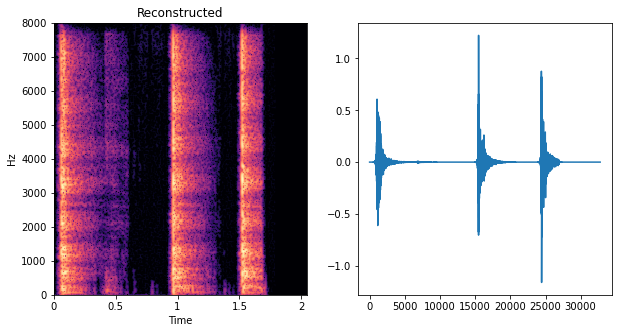

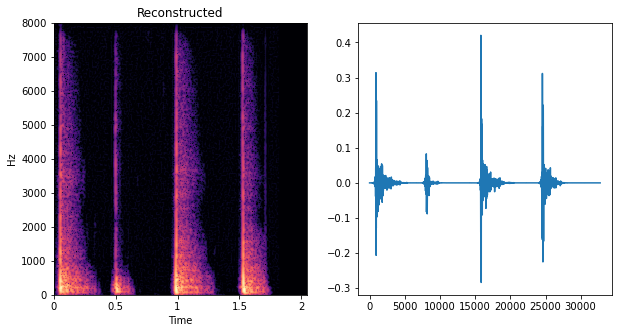

In [15]:
# How does the prototype look like?

tinny_prototype = torch.from_numpy(tinny_prototype).unsqueeze(dim=0).float().cuda()
reconstructed_audio = G.synthesis(torch.stack([tinny_prototype] * 14, dim=1))
filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
reconstructed_audio_wav = pghi_istft(reconstructed_audio)

plot(reconstructed_audio_wav, f'Reconstructed')


muffled_prototype = torch.from_numpy(muffled_prototype).unsqueeze(dim=0).float().cuda()
reconstructed_audio = G.synthesis(torch.stack([muffled_prototype] * 14, dim=1))
filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
reconstructed_audio_wav = pghi_istft(reconstructed_audio)

plot(reconstructed_audio_wav, f'Reconstructed')

torch.Size([1, 128])


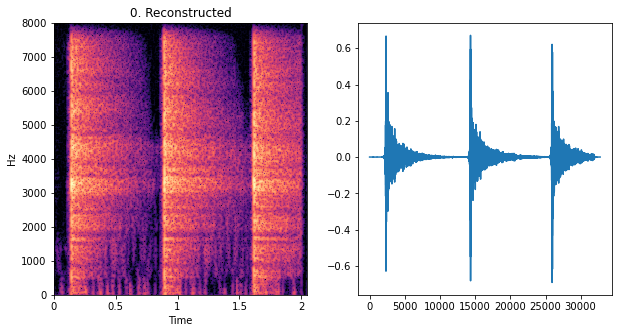

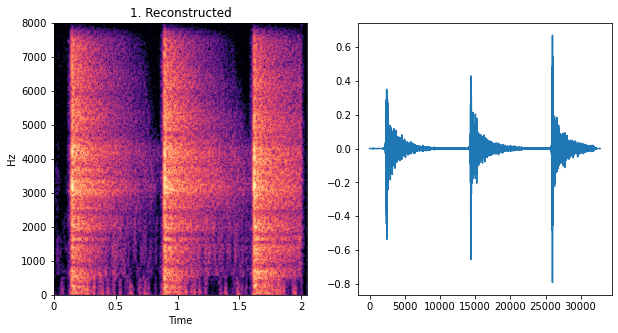

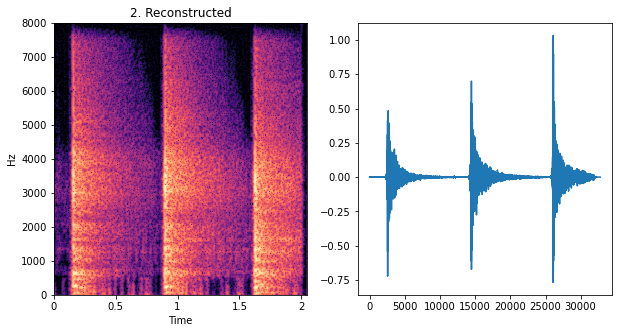

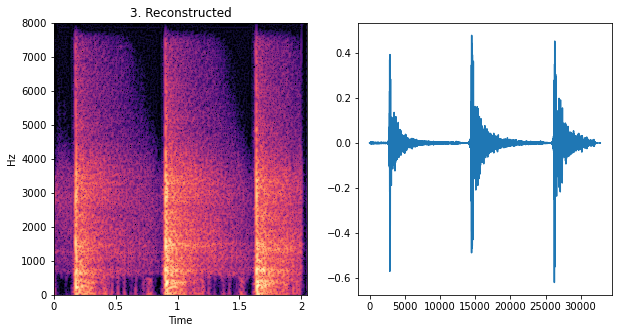

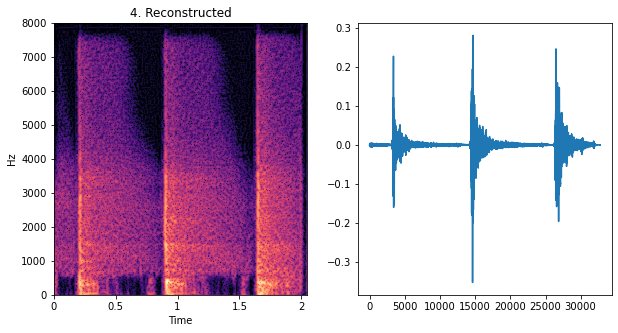

In [21]:
# wood_hit_2_rate1, carpet_hit_1_rate1, cloth_hit_1_rate1, tile_hit_1_rate1
sample_encoded = realdata_file_dict['tile_hit_1_rate1'].float().cuda()
direction_vector = direction.cuda()

num_transforms = 1
num_steps_per_transform = 5

encoded = sample_encoded
for i in np.arange(0, 5, 1): 
    # Recon and plot
    encoded = encoded - (direction_vector * i)
    reconstructed_audio = G.synthesis(torch.stack([encoded] * 14, dim=1))
    
    
    filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
    reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
    reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
    reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
    reconstructed_audio_wav = pghi_istft(reconstructed_audio)
    
    plot(reconstructed_audio_wav, f'%s. Reconstructed' % (i))

torch.Size([1, 128])


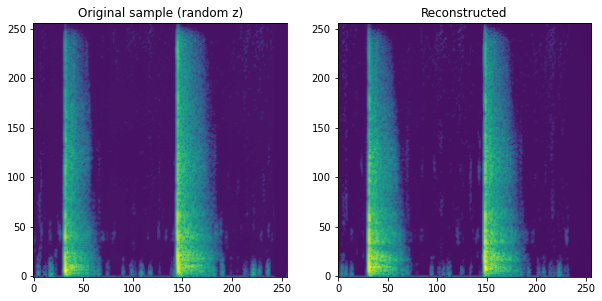

In [47]:
z1 = torch.from_numpy(np.random.randn(1, G.z_dim)).to(device)
fake_ws1 = G.mapping(z1, None)
print(torch.mean(fake_ws1, dim=1).shape)
fake_im1 = G.synthesis(fake_ws1)


mask1 = torch.ones_like(fake_im1)[:, :1, :, :]
net_input1 = torch.cat([fake_im1, mask1], dim=1)
with torch.no_grad():
    encoded1 = netE(net_input1)

reconstructed_im1 = G.synthesis(torch.stack([encoded1] * 14, dim=1))

fig, axs = plt.subplots(ncols=2, figsize=(10,5))
axs[0].set_title('Original sample (random z)')
axs[0].imshow(fake_im1[0][0].cpu().numpy(), origin='lower')

axs[1].set_title('Reconstructed')
axs[1].imshow(reconstructed_im1[0][0].cpu().numpy(), origin='lower')

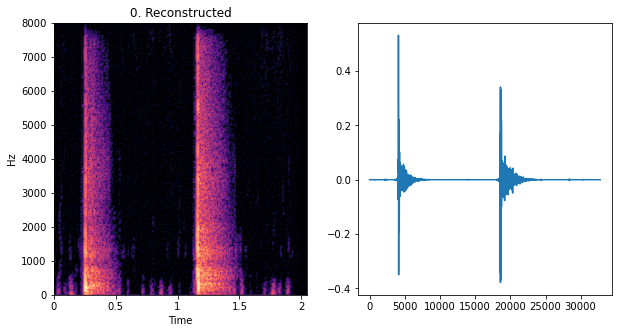

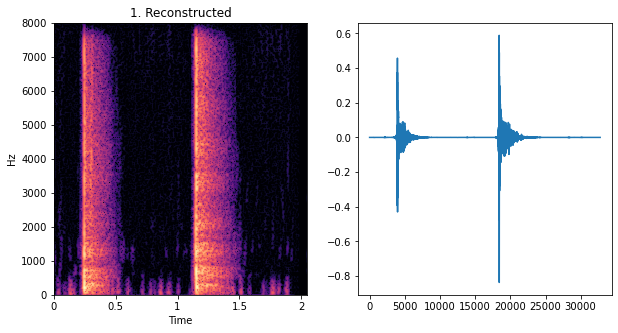

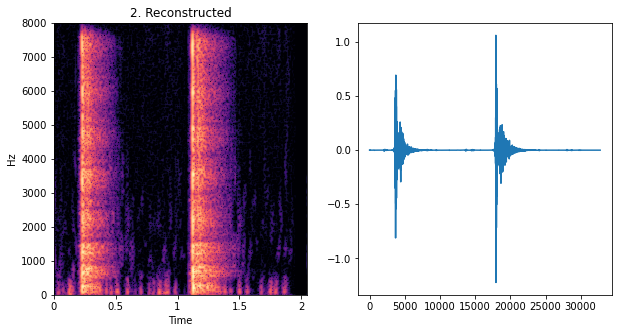

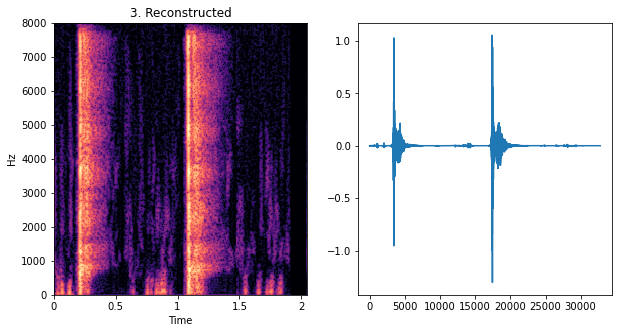

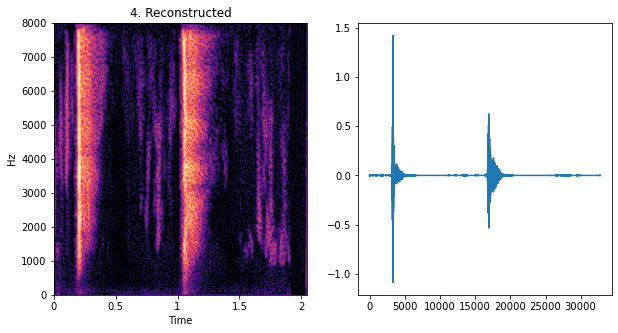

In [49]:
# wood_hit_2_rate1, carpet_hit_1_rate1, cloth_hit_1_rate1, tile_hit_1_rate1
sample_encoded = torch.mean(fake_ws1, dim=1)
direction_vector = direction.cuda()

num_transforms = 1
num_steps_per_transform = 5

encoded = sample_encoded
for i in np.arange(0, 5, 1): 
    # Recon and plot
    encoded = encoded + (direction_vector * i)
    reconstructed_audio = G.synthesis(torch.stack([encoded] * 14, dim=1))
    
    
    filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
    reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
    reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
    reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
    reconstructed_audio_wav = pghi_istft(reconstructed_audio)
    
    plot(reconstructed_audio_wav, f'%s. Reconstructed' % (i))

# Encoded direction in specific layers only

In [115]:
# a = torch.stack([encoded] * 7, dim=1)
# b = torch.stack([sample_encoded] * 7, dim=1)
# a.shape, b.shape

# torch.cat([a, b], dim=1)

In [116]:
# # wood_hit_2_rate1, carpet_hit_1_rate1, cloth_hit_1_rate1, tile_hit_1_rate1
# sample_encoded = realdata_file_dict['tile_hit_1_rate1'].float().cuda()
# direction_vector = direction.cuda()

# num_transforms = 1
# num_steps_per_transform = 5

# encoded = sample_encoded
# for i in np.arange(0, 10, 2): 
#     # Recon and plot
#     encoded = encoded - (direction_vector * i)
#     #reconstructed_audio = G.synthesis(torch.stack([encoded] * 14, dim=1))
    
#     a = torch.stack([sample_encoded] * 8, dim=1)
#     b = torch.stack([encoded] * 6, dim=1)
#     encoded_stack = torch.cat([b, a], dim=1)
#     reconstructed_audio = G.synthesis(encoded_stack)
    
    
#     filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
#     reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
#     reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
#     reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
#     reconstructed_audio_wav = pghi_istft(reconstructed_audio)
    
#     plot(reconstructed_audio_wav, f'%s. Reconstructed' % (i))

# Encoding an OOD point. Does our method do better because of w_avg?

In [119]:
# # wood_hit_2_rate1, carpet_hit_1_rate1, cloth_hit_1_rate1, tile_hit_1_rate1
# sample_encoded = torch.from_numpy(out_of_distribution_point).unsqueeze(dim=0).float().cuda()#torch.ones_like(encoded).float().cuda()
# direction_vector = direction.cuda()

# num_transforms = 1
# num_steps_per_transform = 5

# encoded = sample_encoded
# for i in np.arange(0, 20, 2): 
#     # Recon and plot
#     encoded = encoded - (direction_vector * i)
#     reconstructed_audio = G.synthesis(torch.stack([encoded] * 14, dim=1))
#     filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
#     reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
#     reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
#     reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
#     reconstructed_audio_wav = pghi_istft(reconstructed_audio)
    
#     plot(reconstructed_audio_wav, f'%s. Reconstructed' % (i))

## Sharp Hits to Scratches

In [53]:
sharphits_arr = []
scratches_arr = []
for rate, loc in enumerate(locs):
    for partial in range(num_samples):
        for tinny_muffled in ['tinny', 'muffled']:
            sharphits_file = f'hit_%s_sample%s_rate%s' % (tinny_muffled, partial, rate)
            scratches_file = f'scratch_%s_sample%s_rate%s' % (tinny_muffled, partial, rate)

            sharphits_encoded = all_samples_dict[sharphits_file]['encoded']
            scratches_encoded = all_samples_dict[scratches_file]['encoded']

            sharphits_arr.append(sharphits_encoded.cpu().numpy()[0])
            scratches_arr.append(scratches_encoded.cpu().numpy()[0])

sharphits_arr = np.array(sharphits_arr)
scratches_arr = np.array(scratches_arr)
print(len(sharphits_arr))

w_avg = G.mapping.w_avg.cpu().numpy()

X_sharphits_arr = (sharphits_arr - w_avg).T
X_scratches_arr = (scratches_arr - w_avg).T

U_sharphits, S_sharphits, VT_sharphits = np.linalg.svd(X_sharphits_arr, full_matrices=0)
U_scratches, S_scratches, VT_scratches = np.linalg.svd(X_scratches_arr, full_matrices=0)

sharphits_prototype = np.mean(sharphits_arr, axis=0) - w_avg
scratches_prototype = np.mean(scratches_arr, axis=0) - w_avg
sharphits_prototype = (w_avg + (U_sharphits[:,:1] @ U_sharphits[:,:1].T @ sharphits_prototype.T)).T
scratches_prototype = (w_avg + U_scratches[:,:1] @ U_scratches[:,:1].T @ scratches_prototype.T).T


direction = sharphits_prototype - scratches_prototype
direction = direction/np.linalg.norm(direction)
direction = torch.from_numpy(direction)


20


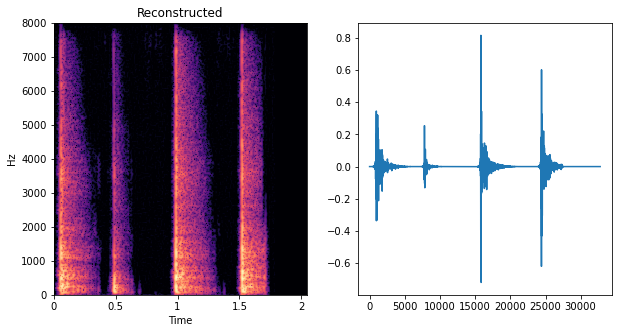

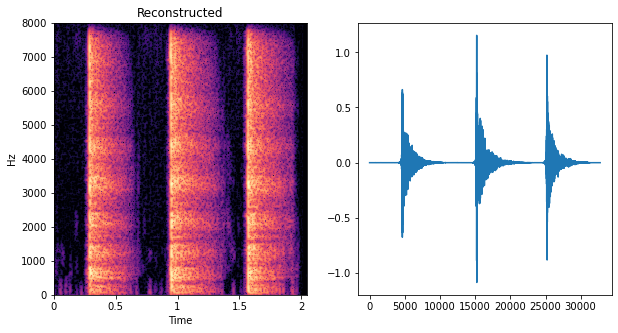

In [54]:
# How does the prototype look like?

sharphits_prototype = torch.from_numpy(sharphits_prototype).unsqueeze(dim=0).float().cuda()
reconstructed_audio = G.synthesis(torch.stack([sharphits_prototype] * 14, dim=1))
filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
reconstructed_audio_wav = pghi_istft(reconstructed_audio)

plot(reconstructed_audio_wav, f'Reconstructed')


scratches_prototype = torch.from_numpy(scratches_prototype).unsqueeze(dim=0).float().cuda()
reconstructed_audio = G.synthesis(torch.stack([scratches_prototype] * 14, dim=1))
filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
reconstructed_audio_wav = pghi_istft(reconstructed_audio)

plot(reconstructed_audio_wav, f'Reconstructed')

Autocorrelation Loss =  tensor(0., device='cuda:0') , MSE Loss =  tensor(0., device='cuda:0')


Autocorrelation Loss =  tensor(0.3150, device='cuda:0') , MSE Loss =  tensor(0.0535, device='cuda:0')


Autocorrelation Loss =  tensor(16.9096, device='cuda:0') , MSE Loss =  tensor(0.2555, device='cuda:0')


Autocorrelation Loss =  tensor(360.8391, device='cuda:0') , MSE Loss =  tensor(0.5603, device='cuda:0')


Autocorrelation Loss =  tensor(350.7332, device='cuda:0') , MSE Loss =  tensor(0.7844, device='cuda:0')


Autocorrelation Loss =  tensor(353.6364, device='cuda:0') , MSE Loss =  tensor(0.8505, device='cuda:0')


Autocorrelation Loss =  tensor(358.1765, device='cuda:0') , MSE Loss =  tensor(0.8534, device='cuda:0')


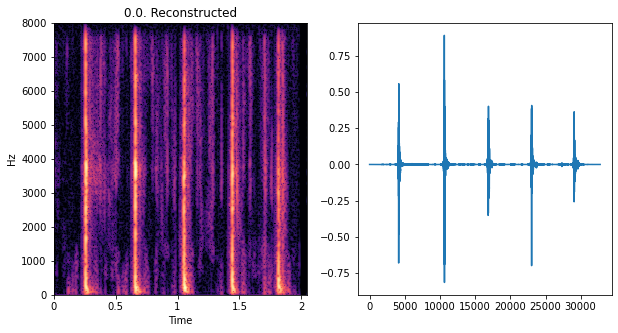

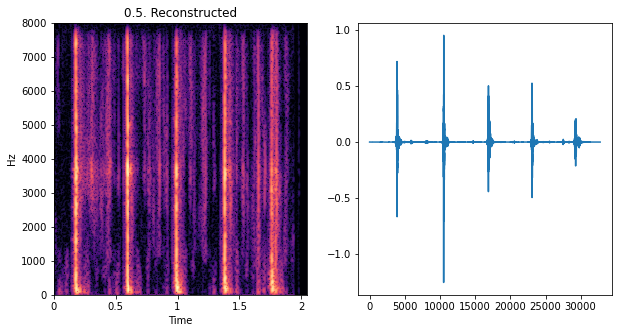

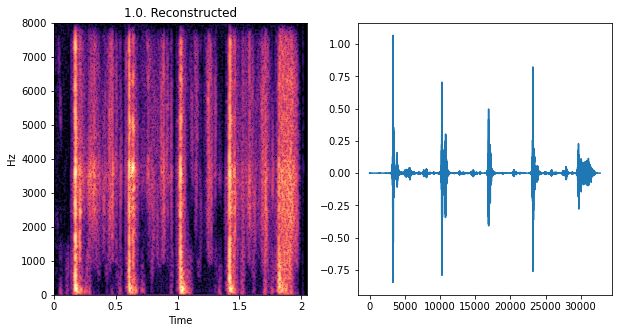

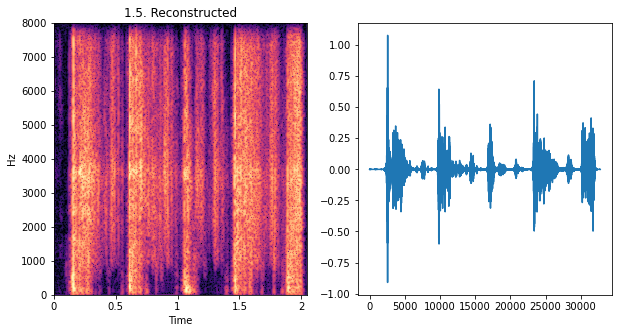

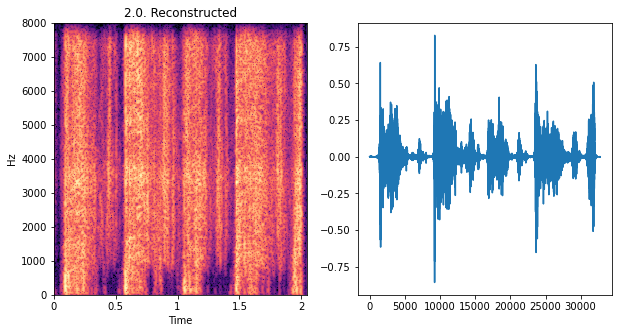

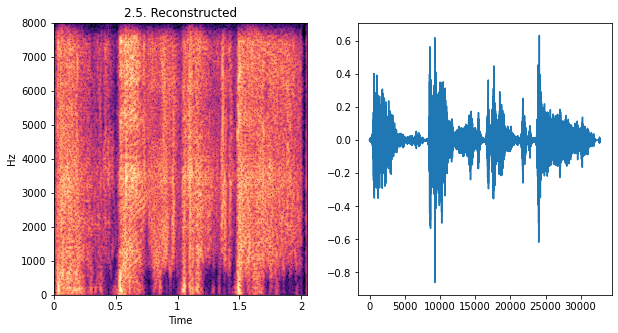

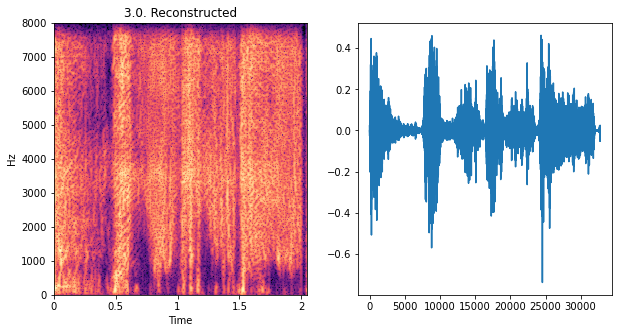

In [63]:
#plastic_hit_4_rate1, tile_hit_5_rate1, cloth_hit_4_rate1, cloth_hit_4_rate2, 
sample_encoded = realdata_file_dict['cloth_hit_4_rate2'].float().cuda()
direction_vector = direction.cuda()

num_transforms = 1
num_steps_per_transform = 5

encoded = sample_encoded
all_recons = []
for i_ind, i in enumerate(np.arange(0, 3.1, 0.5)): 
    # Recon and plot
    encoded = encoded - (direction_vector * i)
    reconstructed_audio = G.synthesis(torch.stack([encoded] * 14, dim=1))
    all_recons.append(reconstructed_audio)
    
    filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
    reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
    reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
    reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
    reconstructed_audio_wav = pghi_istft(reconstructed_audio)
    
    autocorrelation_loss = gram_loss(all_recons[0], all_recons[i_ind])
    mse_loss = mse(all_recons[0], all_recons[i_ind])
    print('Autocorrelation Loss = ', autocorrelation_loss, ', MSE Loss = ', mse_loss)
    
    plot(reconstructed_audio_wav, f'%s. Reconstructed' % (i))

# Deterministic Change in time domain w/ preservation in frequency domain

## Low rate to high rate (both hits and scratches)

In [41]:
lowrate = []
highrate = []
for hittype in ['hit', 'scratch']:
    for partial in range(num_samples):
        for tinny_muffled in ['tinny', 'muffled']:
                lowrate_file = f'%s_%s_sample%s_rate0' % (hittype, tinny_muffled, partial)
                highrate_file = f'%s_%s_sample%s_rate3' % (hittype, tinny_muffled, partial)

                lowrate_encoded = all_samples_dict[lowrate_file]['encoded']
                highrate_encoded = all_samples_dict[highrate_file]['encoded']

                lowrate.append(lowrate_encoded.cpu().numpy()[0])
                highrate.append(highrate_encoded.cpu().numpy()[0])

lowrate_arr = np.array(lowrate)
highrate_arr = np.array(highrate)

w_avg = G.mapping.w_avg.cpu().numpy()

X_lowrate_arr = (lowrate_arr - w_avg).T
X_highrate_arr = (highrate_arr - w_avg).T

# X_lowrate_arr = (lowrate_arr).T
# X_highrate_arr = (highrate_arr).T

U_lowrate, S_lowrate, VT_lowrate = np.linalg.svd(X_lowrate_arr, full_matrices=0)
U_highrate, S_highrate, VT_highrate = np.linalg.svd(X_highrate_arr, full_matrices=0)

lowrate_prototype = np.mean(lowrate_arr, axis=0) - w_avg
highrate_prototype = np.mean(highrate_arr, axis=0) - w_avg
lowrate_prototype = (w_avg + (U_lowrate[:,:1] @ U_lowrate[:,:1].T @ lowrate_prototype.T)).T
highrate_prototype = (w_avg + U_highrate[:,:1] @ U_highrate[:,:1].T @ highrate_prototype.T).T


direction = lowrate_prototype - highrate_prototype
direction = direction/np.linalg.norm(direction)
direction = torch.from_numpy(direction)


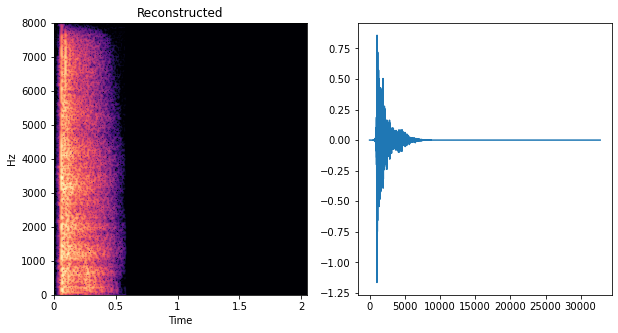

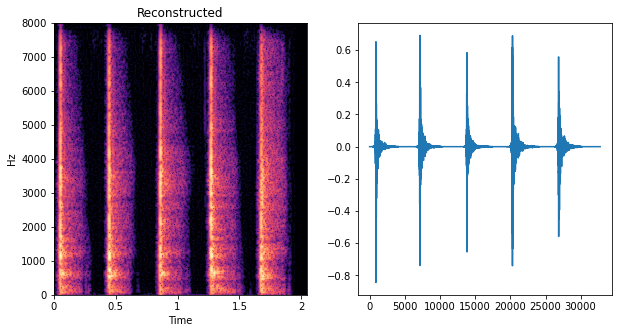

In [42]:
# How does the prototype look like?

lowrate_prototype = torch.from_numpy(lowrate_prototype).unsqueeze(dim=0).float().cuda()
reconstructed_audio = G.synthesis(torch.stack([lowrate_prototype] * 14, dim=1))
filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
reconstructed_audio_wav = pghi_istft(reconstructed_audio)

plot(reconstructed_audio_wav, f'Reconstructed')


highrate_prototype = torch.from_numpy(highrate_prototype).unsqueeze(dim=0).float().cuda()
reconstructed_audio = G.synthesis(torch.stack([highrate_prototype] * 14, dim=1))
filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
reconstructed_audio_wav = pghi_istft(reconstructed_audio)

plot(reconstructed_audio_wav, f'Reconstructed')

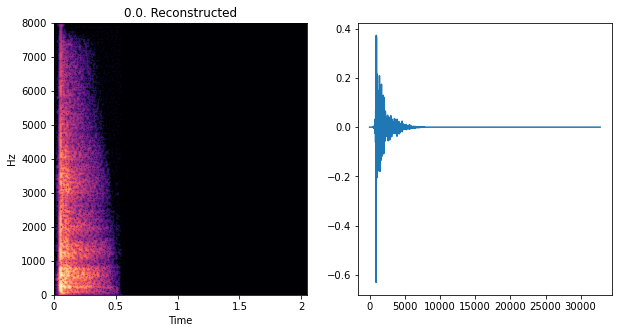

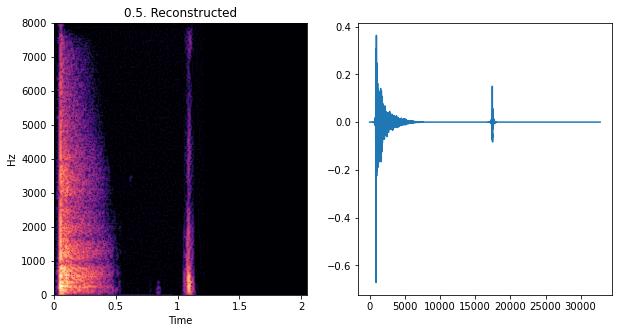

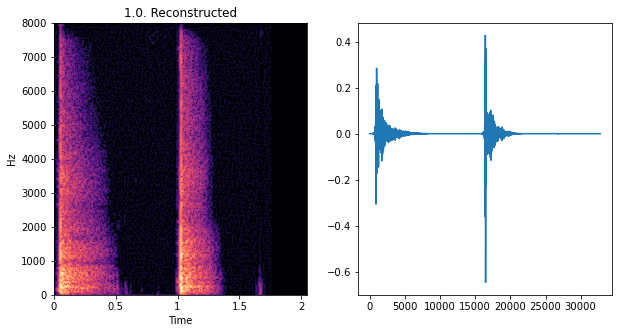

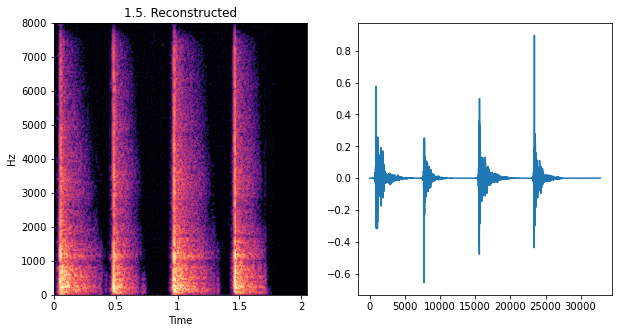

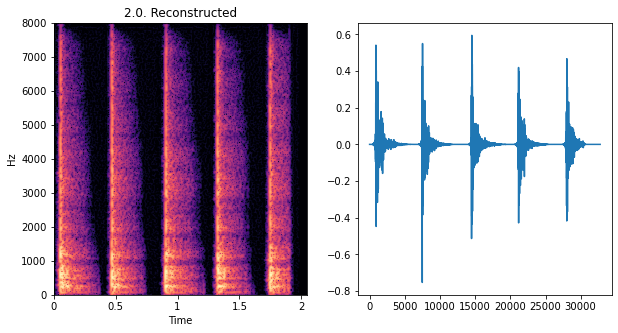

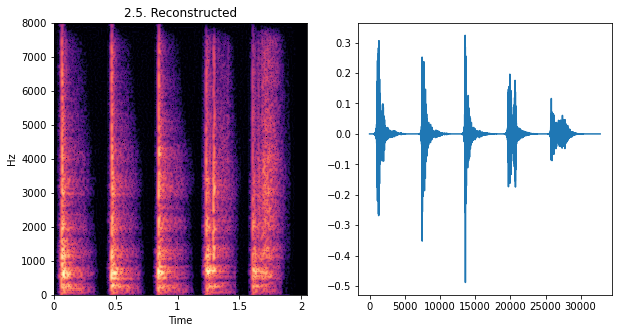

In [43]:
#metal_hit_1_rate0, paper_hit_1_rate1
sample_encoded = realdata_file_dict['metal_hit_1_rate0'].float().cuda()
direction_vector = direction.cuda()

num_transforms = 1
num_steps_per_transform = 5

encoded = sample_encoded
all_recons = []
for i_ind, i in enumerate(np.arange(0, 3, 0.5)): 
    # Recon and plot
    encoded = encoded - (direction_vector * i)
    reconstructed_audio = G.synthesis(torch.stack([encoded] * 14, dim=1))
    all_recons.append(reconstructed_audio)
    
    filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
    reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
    reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
    reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
    reconstructed_audio_wav = pghi_istft(reconstructed_audio)
    
#     autocorrelation_loss = gram_loss(all_recons[0], all_recons[i_ind])
#     mse_loss = mse(all_recons[0], all_recons[i_ind])
#     print('Autocorrelation Loss = ', autocorrelation_loss, ', MSE Loss = ', mse_loss)
    
    plot(reconstructed_audio_wav, f'%s. Reconstructed' % (i))
    


# Random Direction tinny muffled

Autocorrelation Loss =  tensor(0., device='cuda:0') , MSE Loss =  tensor(0., device='cuda:0')


Autocorrelation Loss =  tensor(0.0218, device='cuda:0') , MSE Loss =  tensor(0.0247, device='cuda:0')


Autocorrelation Loss =  tensor(0.0916, device='cuda:0') , MSE Loss =  tensor(0.0456, device='cuda:0')


Autocorrelation Loss =  tensor(0.2295, device='cuda:0') , MSE Loss =  tensor(0.0851, device='cuda:0')


Autocorrelation Loss =  tensor(0.4390, device='cuda:0') , MSE Loss =  tensor(0.1309, device='cuda:0')


Autocorrelation Loss =  tensor(0.6714, device='cuda:0') , MSE Loss =  tensor(0.1979, device='cuda:0')


Autocorrelation Loss =  tensor(0.8633, device='cuda:0') , MSE Loss =  tensor(0.3221, device='cuda:0')


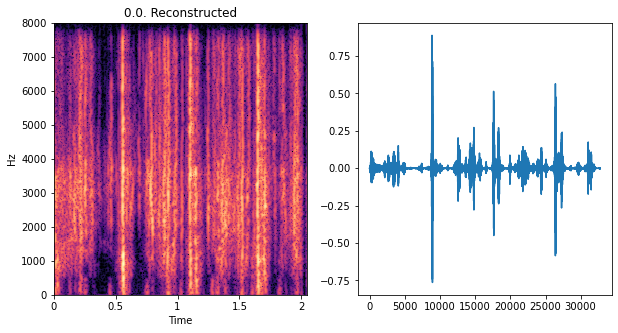

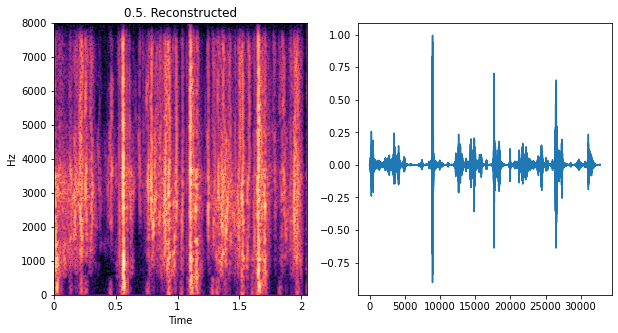

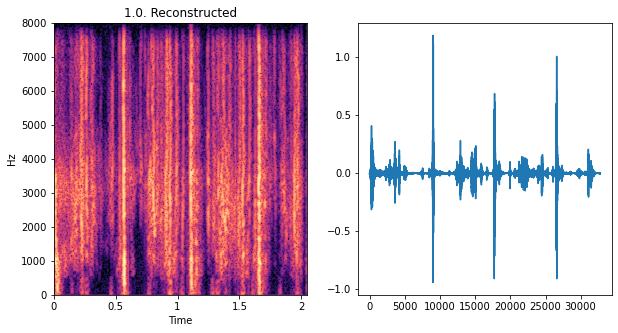

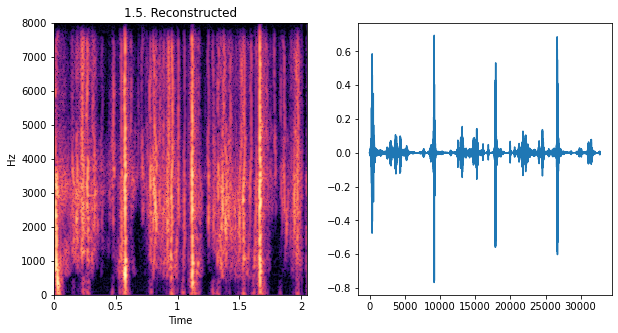

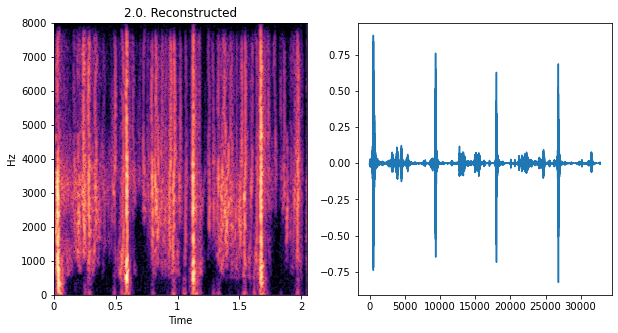

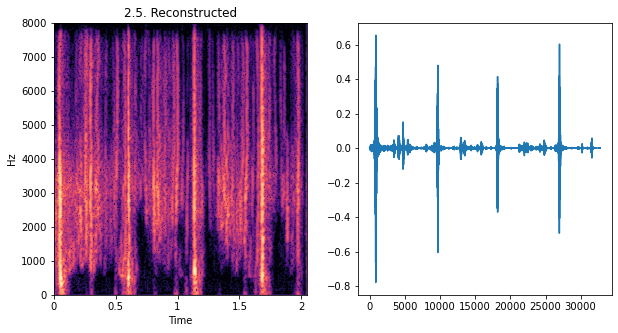

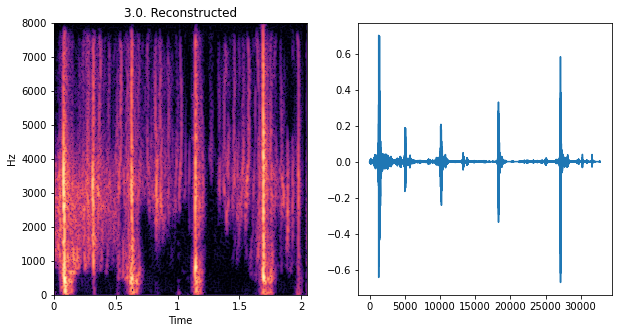

In [69]:
tinny_arr = []
muffled_arr = []
for loc_id, loc in enumerate(locs):
    for sample in range(num_samples):
        tinnier_file = f'hit_tinny_sample%s_rate%s' % (sample, loc_id)
        muffled_file = f'hit_muffled_sample%s_rate%s' % (sample, loc_id)
        
        tinnier_encoded = all_samples_dict[tinnier_file]['encoded']
        muffled_encoded = all_samples_dict[muffled_file]['encoded']
        
        tinny_arr.append(tinnier_encoded.cpu().numpy()[0])
        muffled_arr.append(muffled_encoded.cpu().numpy()[0])
    

w_avg = G.mapping.w_avg.cpu().numpy()

tinny_arr = np.array(tinny_arr)
muffled_arr = np.array(muffled_arr)

X_tinny_arr = (tinny_arr - w_avg).T
X_muffled_arr = (muffled_arr - w_avg).T

U_tinny, S_tinny, VT_tinny = np.linalg.svd(X_tinny_arr, full_matrices=0)
U_muffled, S_muffled, VT_muffled = np.linalg.svd(X_muffled_arr, full_matrices=0)

tinny_prototype = np.mean(tinny_arr, axis=0) - w_avg
muffled_prototype = np.mean(muffled_arr, axis=0) - w_avg
tinny_prototype = (w_avg + (U_tinny[:,:1] @ U_tinny[:,:1].T @ tinny_prototype.T)).T
muffled_prototype = (w_avg + U_muffled[:,:1] @ U_muffled[:,:1].T @ muffled_prototype.T).T


direction = tinny_prototype - muffled_prototype
direction = direction/np.linalg.norm(direction)
direction = torch.from_numpy(direction)


# wood_hit_2_rate1, carpet_hit_1_rate1, cloth_hit_1_rate1, tile_hit_1_rate1; Wonderful: water_scratch_1_rate1
sample_encoded = realdata_file_dict['water_scratch_1_rate3'].float().cuda()
direction_vector = direction.cuda()

num_transforms = 1
num_steps_per_transform = 5

encoded = sample_encoded
all_recons = []
for i_ind, i in enumerate(np.arange(0, 3.5, 0.5)): 
    # Recon and plot
    encoded = encoded - (direction_vector * i)
    reconstructed_audio = G.synthesis(torch.stack([encoded] * 14, dim=1))
    all_recons.append(reconstructed_audio)
    
    filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
    reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
    reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
    reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
    reconstructed_audio_wav = pghi_istft(reconstructed_audio)
    
    autocorrelation_loss = gram_loss(all_recons[0], all_recons[i_ind])
    mse_loss = mse(all_recons[0], all_recons[i_ind])
    print('Autocorrelation Loss = ', autocorrelation_loss, ', MSE Loss = ', mse_loss)
    
    plot(reconstructed_audio_wav, f'%s. Reconstructed' % (i))
    
    

In [70]:
direction_np = direction_vector.cpu().numpy()
random_vectors = np.random.randn(127, 128)
random_vectors_ = np.vstack([direction_np, random_vectors])

# random_vectors = np.random.randn(128, 128)

print(random_vectors_.shape)

q, r = np.linalg.qr(random_vectors_)
q = q.T
print('Are they orthonormal? : ',np.allclose(q@q.T, np.eye(128,128)), q.shape)

orthonormal_directions = torch.from_numpy(q).float().cuda()

(128, 128)
Are they orthonormal? :  True (128, 128)


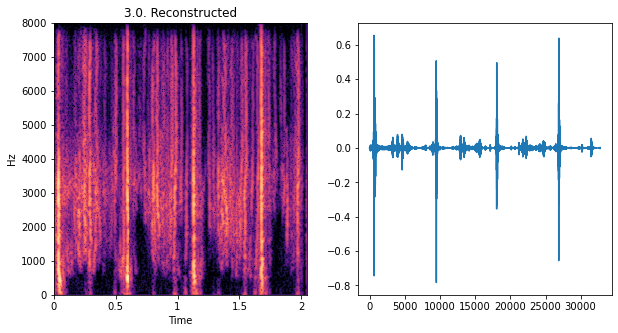

In [71]:
sample_encoded = realdata_file_dict['water_scratch_1_rate3'].float().cuda()
encoded = sample_encoded - (direction_vector * 6) # Point where we want to explore
    
reconstructed_audio = G.synthesis(torch.stack([encoded] * 14, dim=1))
filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
reconstructed_audio_wav = pghi_istft(reconstructed_audio)

plot(reconstructed_audio_wav, f'%s. Reconstructed' % (i))

Autocorrelation Loss =  tensor(0., device='cuda:0') , MSE Loss =  tensor(0., device='cuda:0')


Autocorrelation Loss =  tensor(0.2715, device='cuda:0') , MSE Loss =  tensor(0.0771, device='cuda:0')


Autocorrelation Loss =  tensor(0.1379, device='cuda:0') , MSE Loss =  tensor(0.0791, device='cuda:0')


Autocorrelation Loss =  tensor(0.1211, device='cuda:0') , MSE Loss =  tensor(0.0822, device='cuda:0')


Autocorrelation Loss =  tensor(0.2494, device='cuda:0') , MSE Loss =  tensor(0.1194, device='cuda:0')


Autocorrelation Loss =  tensor(0.2414, device='cuda:0') , MSE Loss =  tensor(0.1580, device='cuda:0')


Autocorrelation Loss =  tensor(0.1718, device='cuda:0') , MSE Loss =  tensor(0.0645, device='cuda:0')


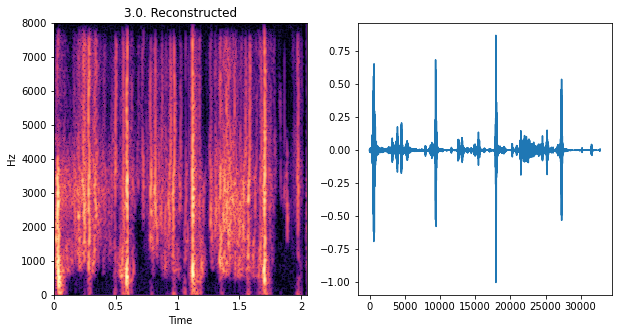

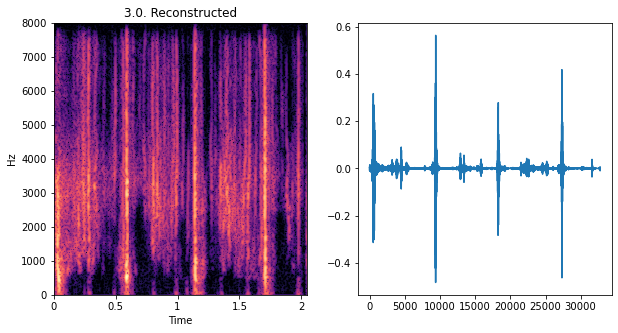

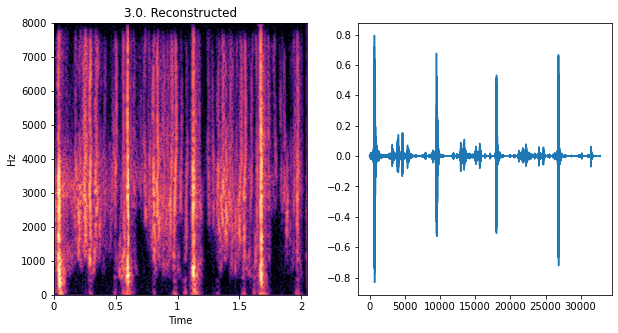

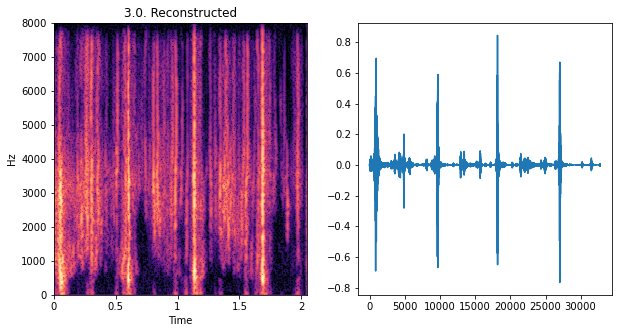

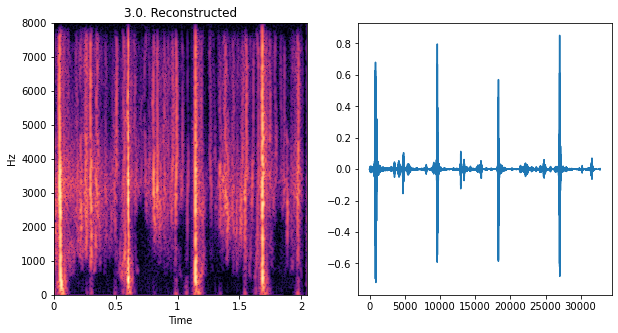

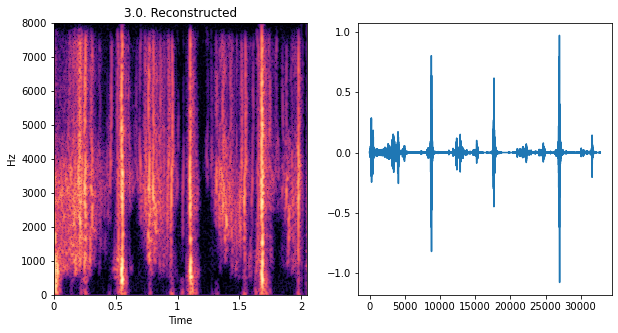

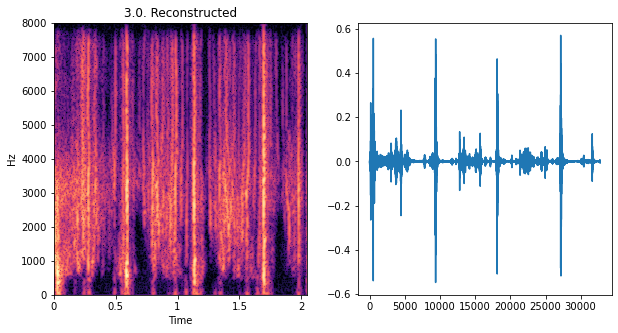

In [75]:
all_recons = []
for ind_d, direction in enumerate(orthonormal_directions[:7]):
    encoded_ = encoded + (direction * 2)
    reconstructed_audio = G.synthesis(torch.stack([encoded_] * 14, dim=1))
    all_recons.append(reconstructed_audio)
    
    filler = torch.full((1, 1, 1, reconstructed_audio[0].shape[1]), torch.min(reconstructed_audio)).cuda()
    reconstructed_audio = torch.cat([reconstructed_audio, filler], dim=2)
    reconstructed_audio = renormalize(reconstructed_audio, (torch.min(reconstructed_audio), torch.max(reconstructed_audio)), (pghi_min, pghi_max))
    reconstructed_audio = reconstructed_audio.detach().cpu().numpy()[0]
    reconstructed_audio_wav = pghi_istft(reconstructed_audio)
    
    autocorrelation_loss = gram_loss(all_recons[0], all_recons[ind_d])
    mse_loss = mse(all_recons[0], all_recons[ind_d])
    print('Autocorrelation Loss = ', autocorrelation_loss, ', MSE Loss = ', mse_loss)
    
    plot(reconstructed_audio_wav, f'%s. Reconstructed' % (i))
    
